In [1]:
%pylab inline
import gc
from ddmap import halosim
from configparser import ConfigParser
from ddmap.pixel3D import cartesianGrid3D
from ddmap import halosim

Populating the interactive namespace from numpy and matplotlib


In [2]:
z_h     =   0.24
log_m   =   14.74
M_200   =   10.**(log_m)
conc    =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
# initialize halo
halo    =   halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
nsamp   =   2000000
ra      =   np.random.rand(nsamp)*0.44-0.22
dec     =   np.random.rand(nsamp)*0.44-0.22
z       =   np.ones(nsamp)*0.1
sigma   =   halo.Sigma(ra*3600.,dec*3600.)

# initialize pixel grids
#configName  =   '../../tests/config_pixel_trans.ini'
configName  =   '../../tests/config_pixel_trans_smooth.ini'
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =cartesianGrid3D(parser)
dr      =   halo.DaLens*gridInfo.scale/180*np.pi

1.0075431915262847


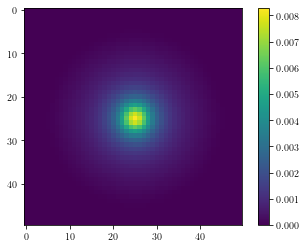

In [3]:
pixSigma=   gridInfo.pixelize_data(ra,dec,z,sigma,method='FFT')[0]/(M_200/dr**2.)
# The (0,0) point is unstable
#pixSigma[gridInfo.ny//2,gridInfo.nx//2]=0.
print(np.sum(pixSigma))
plt.imshow(pixSigma);plt.colorbar()

1.0


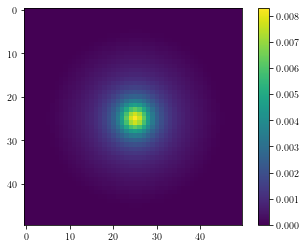

In [4]:
rpix    =   halo.rs_arcsec/gridInfo.scale/3600.
pixSigma2=  np.fft.fftshift(halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,\
         smooth_scale=gridInfo.sigma_pix,c=halo.c,fou=False,lnorm=1))
#pixSigma2[gridInfo.ny//2,gridInfo.nx//2]=0.
print(np.sum(pixSigma2))
plt.imshow(pixSigma2);plt.colorbar()

0.005514131481555638


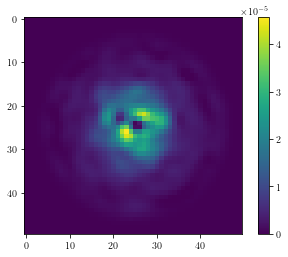

In [5]:
plt.imshow(np.abs(pixSigma2-pixSigma));plt.colorbar()
print(np.max(np.abs(pixSigma2-pixSigma))/np.max(pixSigma2))

## line-of-sight

In [6]:
parser2     =   ConfigParser()
parser2.read('../../tests/config_pixel_los.ini')
gridInfo2   =   cartesianGrid3D(parser2)
lker1=gridInfo2.lensing_kernel(deltaIn=False)

In [7]:
poz_grids=np.arange(0.01,2.1,0.01)
ind=(gridInfo2.zcgrid-0.005)/0.01
print(ind)
ind=ind.astype(np.int64)
print(ind)
z_dens=np.zeros((gridInfo2.nz,len(poz_grids)))
for i in range(gridInfo2.nz):
    z_dens[i,ind[i]]=1.
lker2=gridInfo2.lensing_kernel(poz_grids=poz_grids,z_dens=z_dens,deltaIn=False)
np.testing.assert_array_almost_equal(lker1,lker2,5)

[ 20.5  40.5  50.5  62.5  74.5  84.5  95.5 111.5 135.5 199.5]
[ 20  40  50  62  74  84  95 111 135 199]


In [8]:
lker3=[]
for i in range(gridInfo2.nzl):
    halo=halosim.nfw_lensWB00(ra=0.,dec=0.,\
        redshift=gridInfo2.zlcgrid[i],mass=1e14,conc=0.1)
    lker3.append(halo.lensKernel(gridInfo2.zcgrid))
    del halo
    gc.collect()
lker3=np.stack(lker3).T*1e14
np.testing.assert_array_almost_equal(lker3,lker2,5)